## Working with OpenEAGGR ISEA4T in Vgrid DGGS

[![image](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/opengeoshub/vgrid/blob/main/docs/notebooks/07_isea4t.ipynb)
[![image](https://mybinder.org/badge_logo.svg)](https://mybinder.org/v2/gh/opengeoshub/vgrid/HEAD?filepath=docs/notebooks/07_isea4t.ipynb)
[![image](https://studiolab.sagemaker.aws/studiolab.svg)](https://studiolab.sagemaker.aws/import/github/opengeoshub/vgrid/blob/main/docs/notebooks/07_isea4t.ipynb)
[![image](https://jupyterlite.rtfd.io/en/latest/_static/badge.svg)](https://jupyterlite.gishub.vn/lab/index.html?path=notebooks/vgrid/07_isea4t.ipynb)

Full Vgrid DGGS documentation is available at [vgrid document](https://vgrid.gishub.vn).

To work with Vgrid DGGS directly in GeoPandas and Pandas, please use [vgridpandas](https://pypi.org/project/vgridpandas/). Full Vgridpandas DGGS documentation is available at [vgridpandas document](https://vgridpandas.gishub.vn).

To work with Vgrid DGGS in QGIS, install the [Vgrid Plugin](https://plugins.qgis.org/plugins/vgridtools/).

To visualize DGGS in Maplibre GL JS, try the [vgrid-maplibre](https://www.npmjs.com/package/vgrid-maplibre) library.

For an interactive demo, visit the [Vgrid Homepage](https://vgrid.vn).

### Install vgrid
Uncomment the following line to install [vgrid](https://pypi.org/project/vgrid/).

In [1]:
# %pip install vgrid --upgrade

### latlon2isea4t

In [1]:
from vgrid.conversion.latlon2dggs import latlon2isea4t

lat = 10.775276
lon = 106.706797
res = 12
isea4t_id = latlon2isea4t(lat, lon, res)
isea4t_id

'13102313331320'

### ISEA4T to Polygon

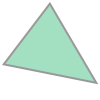

In [3]:
from vgrid.conversion.dggs2geo.isea4t2geo import isea4t2geo

isea4t_geo = isea4t2geo(isea4t_id)
isea4t_geo

### ISEA4T to GeoJSON        

In [2]:
from vgrid.conversion.dggs2geo.isea4t2geo import isea4t2geojson

isea4t_geojson = isea4t2geojson(isea4t_id)
# isea4t_geojson

### Vector to ISEA4T

#### (Multi)Point to ISEA4T

Processing features: 100%|██████████| 12/12 [00:00<00:00, 1496.05it/s]


<Axes: >

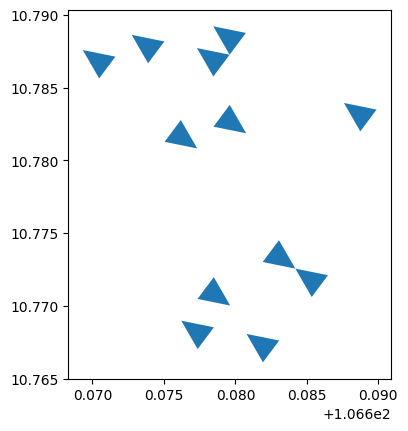

In [1]:
from vgrid.conversion.vector2dggs.vector2isea4t import vector2isea4t
import geopandas as gpd

file_path = (
    "https://raw.githubusercontent.com/opengeoshub/vopendata/main/shape/point.geojson"
)

gdf = gpd.read_file(file_path)

point_to_isea4t = vector2isea4t(
    gdf,
    # resolution = 15,
    topology=True,
    output_format="gpd",
)
point_to_isea4t.plot()

#### (Multi)Polygon to ISEA4T

Processing features: 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]


<Axes: >

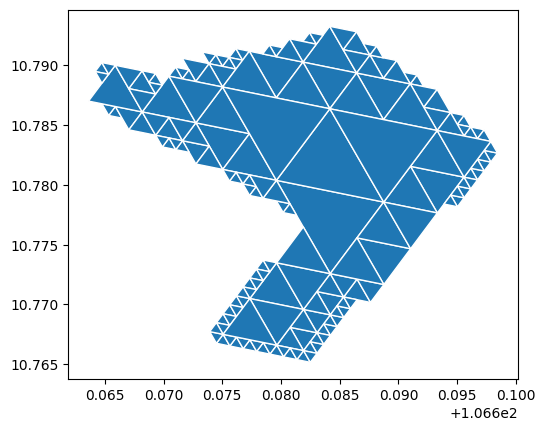

In [ ]:
from vgrid.conversion.vector2dggs.vector2isea4t import vector2isea4t

file_path = "https://raw.githubusercontent.com/opengeoshub/vopendata/main/shape/polygon2.geojson"
vector_to_isea4t = vector2isea4t(
    file_path,
    resolution=16,
    compact=True,
    predicate="intersects",
    output_format="gpd",
)
# Visualize the output
vector_to_isea4t.plot(edgecolor="white")

### ISEA4T Compact

<Axes: >

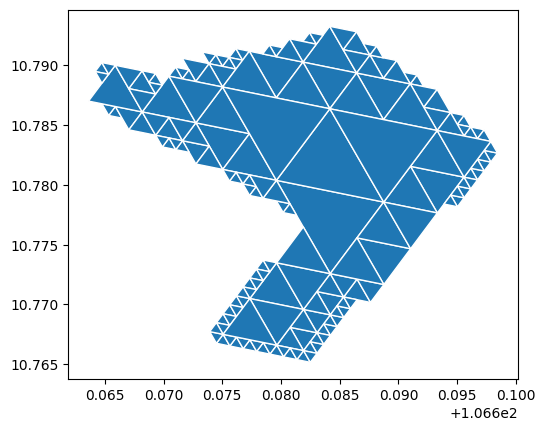

In [3]:
from vgrid.conversion.dggscompact.isea4tcompact import isea4tcompact

isea4t_compacted = isea4tcompact(vector_to_isea4t, output_format="gpd")
isea4t_compacted.plot(edgecolor="white")

### ISEA4T Expand

<Axes: >

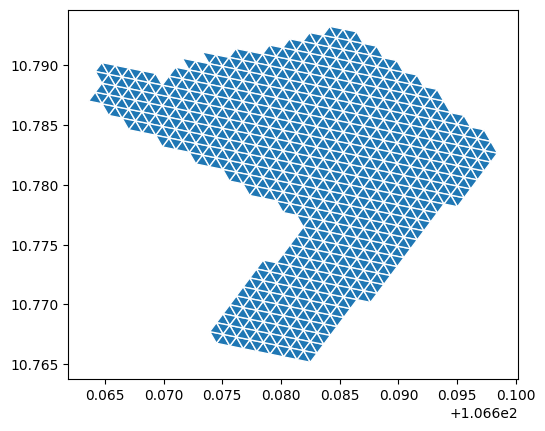

In [4]:
from vgrid.conversion.dggscompact.isea4tcompact import isea4texpand

isea4t_expanded = isea4texpand(vector_to_isea4t, resolution=16, output_format="gpd")
isea4t_expanded.plot(edgecolor="white")

### ISEA4T Binning

Generating ISEA4T DGGS: 100%|██████████| 2534/2534 [00:00<00:00, 4880.13 cells/s]


<Axes: >

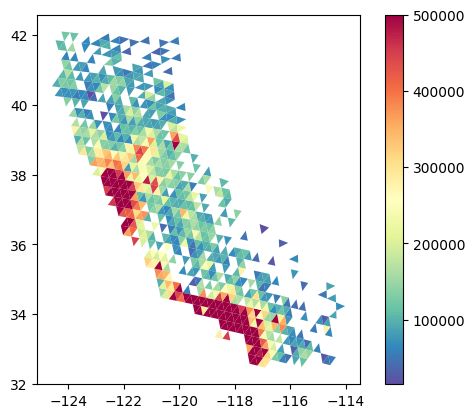

In [2]:
from vgrid.binning.isea4tbin import isea4tbin

file_path = (
    "https://raw.githubusercontent.com/opengeoshub/vopendata/main/csv/housing.csv"
)
stats = "max"
numeric_col = "median_house_value"

isea4t_bin = isea4tbin(
    file_path,
    resolution=8,
    stats=stats,
    numeric_col=numeric_col,
    # category_col="category",
    output_format="gpd",
)
isea4t_bin.plot(
    column=f"{numeric_col}_{stats}",  # numeric column to base the colors on
    cmap="Spectral_r",  # color scheme (matplotlib colormap)
    legend=True,
    linewidth=0.2,  # boundary width (optional)
)

### Raster to ISEA4T

#### Download and open raster

rgb.tif already exists. Skip downloading. Set overwrite=True to overwrite.
{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 240, 'height': 147, 'count': 3, 'crs': CRS.from_wkt('GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]'), 'transform': Affine(2.6640125000199077e-06, 0.0, 106.708118755,
       0.0, -2.6640136054383103e-06, 10.812568272)}


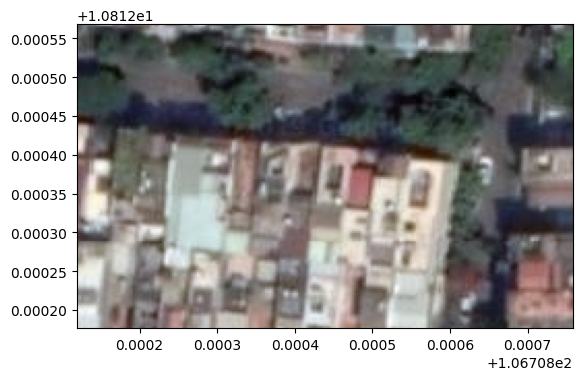

<Axes: >

In [1]:
from vgrid.utils.io import download_file
import rasterio
from rasterio.plot import show

raster_url = (
    "https://raw.githubusercontent.com/opengeoshub/vopendata/main/raster/rgb.tif"
)
raster_file = download_file(raster_url)
src = rasterio.open(raster_file, "r")
print(src.meta)
show(src)

#### Convert raster to ISEA4T

In [10]:
# %pip install folium

In [2]:
from vgrid.conversion.raster2dggs.raster2isea4t import raster2isea4t
from vgrid.utils.io import download_file

raster_url = (
    "https://raw.githubusercontent.com/opengeoshub/vopendata/main/raster/rgb.tif"
)
raster_file = download_file(raster_url)

raster_to_isea4t = raster2isea4t(raster_file, stats="mean", output_format="gpd")

# Visualize the output
import folium

m = folium.Map(tiles="CartoDB positron", max_zoom=28)

isea4t_layer = folium.GeoJson(
    raster_to_isea4t,
    style_function=lambda x: {
        "fillColor": f"rgb({x['properties']['band_1']}, {x['properties']['band_2']}, {x['properties']['band_3']})",
        "fillOpacity": 1,
        "color": "black",
        "weight": 1,
    },
    popup=folium.GeoJsonPopup(
        fields=["isea4t", "band_1", "band_2", "band_3"],
        aliases=["ISEA4T ID", "Band 1", "Band 2", "Band 3"],
        style="""
            background-color: white;
            border: 2px solid black;
            border-radius: 3px;
            box-shadow: 3px;
        """,
    ),
).add_to(m)

m.fit_bounds(isea4t_layer.get_bounds())

# Display the map
m

rgb.tif already exists. Skip downloading. Set overwrite=True to overwrite.
Cell size: 0.08638527081938627 m2
Nearest ISEA4T resolution determined: 23


Converting raster to ISEA4T: 100%|██████████| 8455/8455 [00:01<00:00, 5014.35 cells/s]


### ISEA4T Generator

Generating ISEA4T DGGS: 100%|██████████| 116/116 [00:00<00:00, 6065.06 cells/s]


<Axes: >

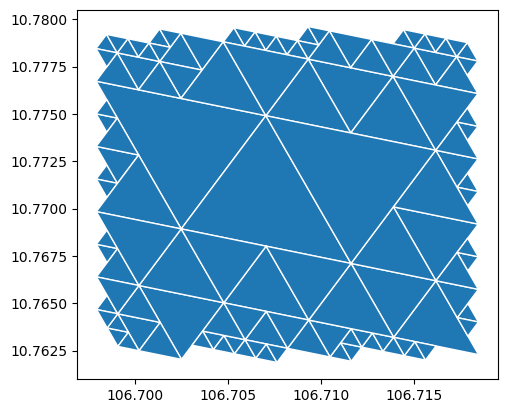

In [3]:
from vgrid.generator.isea4tgrid import isea4tgrid

bbox = [106.699007, 10.762811, 106.717674, 10.778649]
isea4t_grid = isea4tgrid(
    resolution=16,
    bbox=bbox,
    compact=True,
    output_format="gpd",
    fix_antimeridian="shift_west",
)
# isea4t_grid = isea4tgrid(resolution=16,bbox=[106.699007, 10.762811, 106.717674, 10.778649],output_format="gpd")
isea4t_grid.plot(edgecolor="white")

### ISEA4T Inspect

In [ ]:
from vgrid.stats.isea4tstats import isea4tinspect

resolution = 5
isea4t_inspect = isea4tinspect(resolution)
isea4t_inspect.head()

Generating ISEA4T DGGS: 100%|██████████| 20480/20480 [00:02<00:00, 6998.51 cells/s]


,isea4t,resolution,center_lat,center_lon,avg_edge_len,cell_area,cell_perimeter,geometry,crossed,norm_area,ipq,zsc,cvh
0,0000000,5,52.798043,-144.000000,249995.286027,2.706746e+10,749985.858081,"POLYGON ((-144 51.51071, -145.88123 53.44171, ...",False,1.086805,0.604716,0.777614,1.0
1,0000001,5,53.993894,-144.000000,230922.987391,2.284392e+10,692768.962173,"POLYGON ((-144 55.09826, -145.88123 53.44171, ...",False,0.917222,0.598141,0.773379,1.0
2,0000002,5,52.190361,-145.690007,230945.739381,2.284876e+10,692837.218144,"POLYGON ((-145.88123 53.44171, -147.18879 51.6...",False,0.917417,0.598150,0.773384,1.0
3,0000003,5,52.190361,-142.309993,230945.739386,2.284876e+10,692837.218159,"POLYGON ((-142.11877 53.44171, -144 51.51071, ...",False,0.917417,0.598150,0.773384,1.0
4,0000010,5,50.215849,-144.000000,238726.466768,2.462431e+10,716179.400305,"POLYGON ((-144 51.51071, -145.58435 49.56842, ...",False,0.988708,0.603296,0.776702,1.0


### ISEA4T Normalized Area Histogram

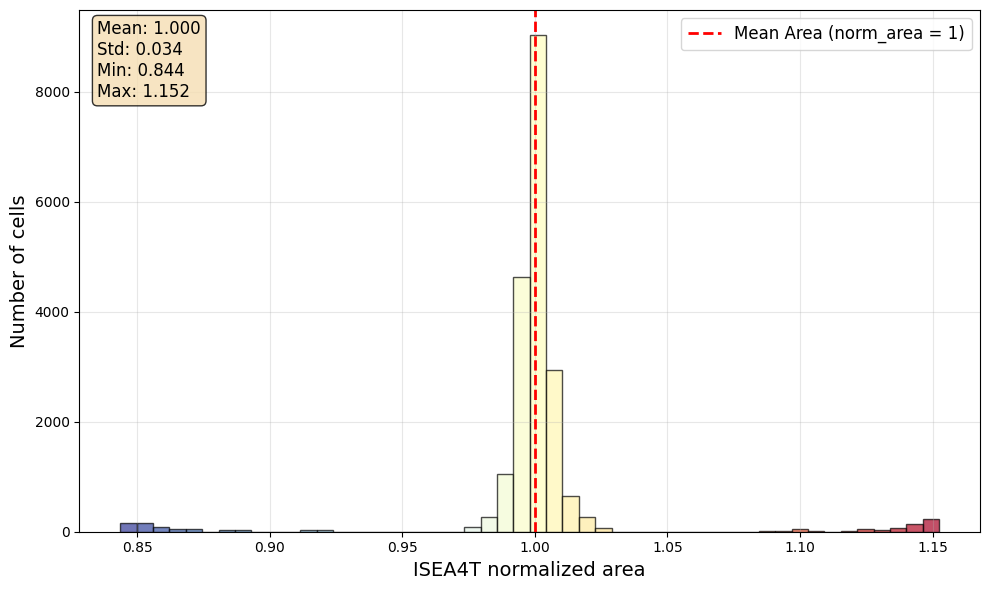

In [14]:
from vgrid.stats.isea4tstats import isea4t_norm_area_hist

isea4t_norm_area_hist(isea4t_inspect)

### Distribution of ISEA4T Area Distortions

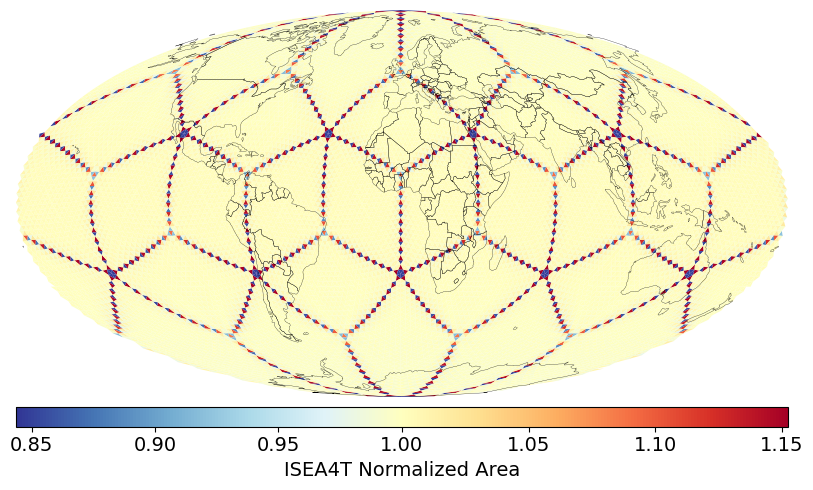

In [15]:
from vgrid.stats.isea4tstats import isea4t_norm_area

isea4t_norm_area(isea4t_inspect)

### ISEA4T IPQ Compactness Histogram

Isoperimetric Inequality (IPQ) Compactness (suggested by [Osserman, 1978](https://sites.math.washington.edu/~toro/Courses/20-21/MSF/osserman.pdf)):

$$C_{IPQ} = \frac{4 \pi A}{p^2}$$
The range of the IPQ compactness metric is [0,1]. 

A circle represents the maximum compactness with a value of 1. 

As shapes become more irregular or elongated, their compactness decreases toward 0.


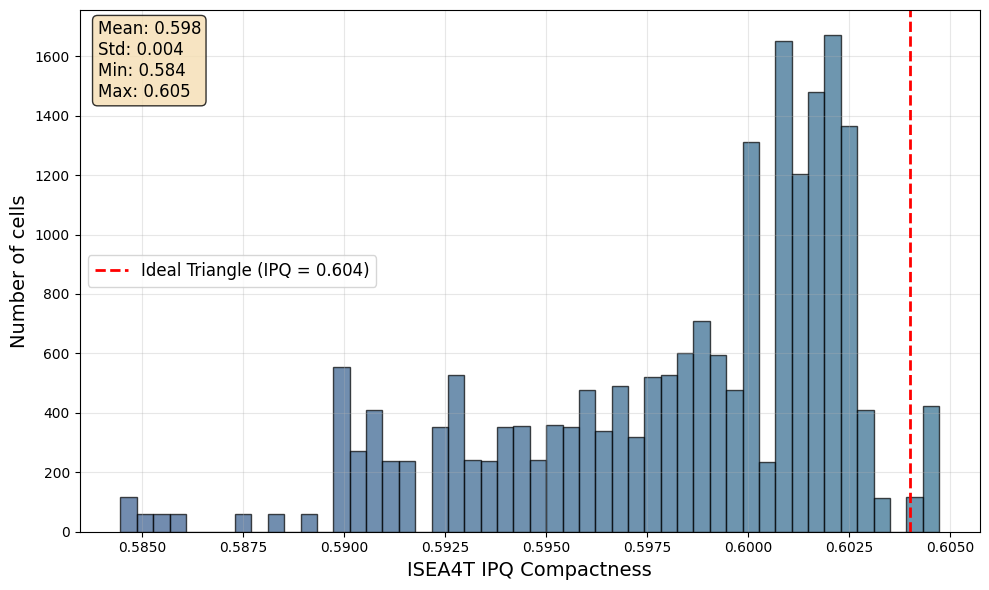

In [16]:
from vgrid.stats.isea4tstats import isea4t_compactness_ipq_hist

isea4t_compactness_ipq_hist(isea4t_inspect)

### Distribution of ISEA4T IPQ Compactness

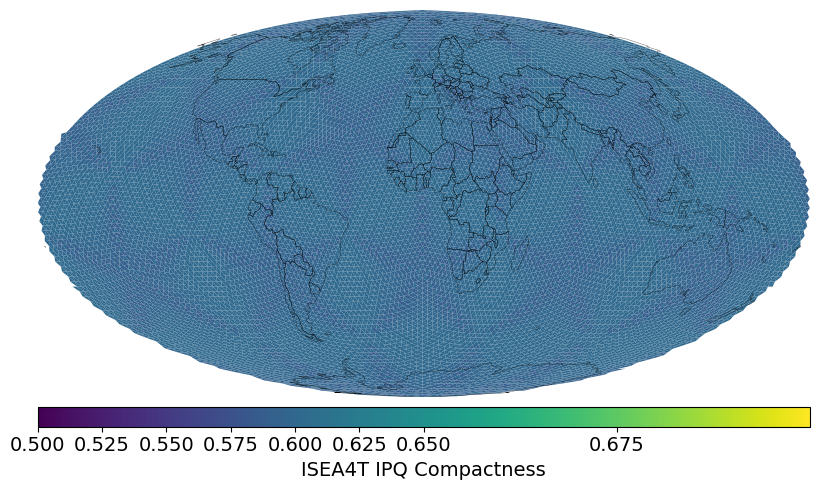

In [17]:
from vgrid.stats.isea4tstats import isea4t_compactness_ipq

isea4t_compactness_ipq(isea4t_inspect)

### ISEA4T Convex hull Compactness Histogram:

$$C_{CVH} = \frac{A}{A_{CVH}}$$


The range of the convex hull compactness metric is [0,1]. 

As shapes become more concave, their convex hull compactness decreases toward 0.

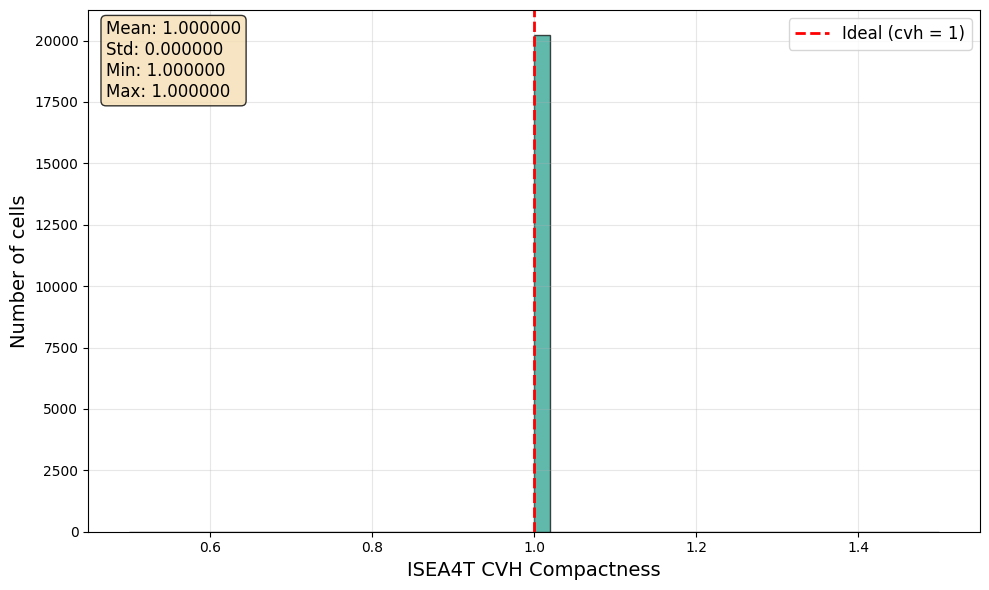

In [18]:
from vgrid.stats.isea4tstats import isea4t_compactness_cvh_hist

isea4t_compactness_cvh_hist(isea4t_inspect)

### Distribution of ISEA4T Convex hull Compactness

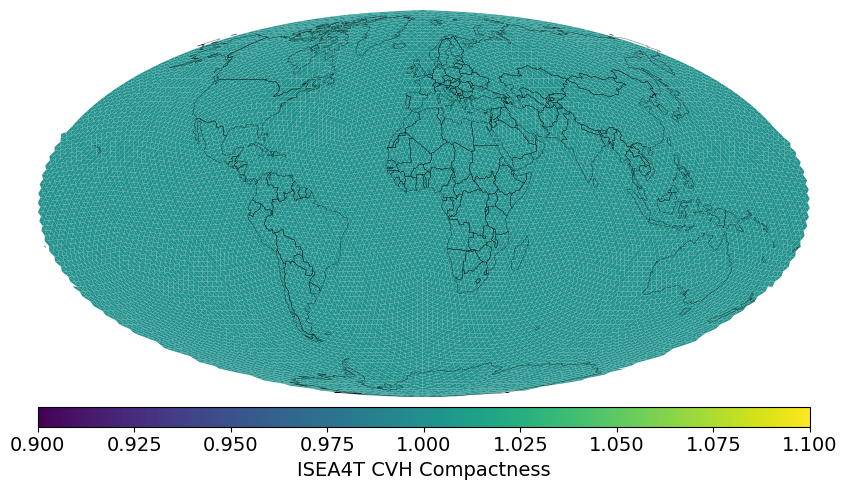

In [19]:
from vgrid.stats.isea4tstats import isea4t_compactness_cvh

isea4t_compactness_cvh(isea4t_inspect)

### ISEA4T Statistics

Characteristic Length Scale (CLS - suggested by Ralph Kahn): the diameter of a spherical cap of the same cell's area

In [1]:
from vgrid.stats.isea4tstats import isea4tstats

isea4tstats()

,resolution,number_of_cells,avg_edge_len_m,avg_cell_area_m2,cls_m
0,0,20,7.674458e+06,2.550328e+13,5.746990e+06
1,1,80,3.837229e+06,6.375820e+12,2.855171e+06
2,2,320,1.918614e+06,1.593955e+12,1.425344e+06
3,3,1280,9.593072e+05,3.984888e+11,7.123930e+05
4,4,5120,4.796536e+05,9.962219e+10,3.561617e+05
5,5,20480,2.398268e+05,2.490555e+10,1.780765e+05
6,6,81920,1.199134e+05,6.226387e+09,8.903771e+04
7,7,327680,5.995670e+04,1.556597e+09,4.451879e+04
8,8,1310720,2.997835e+04,3.891492e+08,2.225939e+04
9,9,5242880,1.498918e+04,9.728730e+07,1.112969e+04
